In [3]:
# Librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.preprocessing import PolynomialFeatures
import plotly.express as px
from scipy.stats import spearmanr
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score

In [63]:
df = pd.read_csv("sleep_cycle_productivity.csv")
df.head(10)

,Date,Person_ID,Age,Gender,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
0,2024-04-12,1860,32,Other,23.33,4.61,5.28,3,86,87,116,8.808920,8,3,6
1,2024-11-04,1769,41,Female,21.02,2.43,5.41,5,32,21,88,6.329833,10,3,7
2,2024-08-31,2528,20,Male,22.10,3.45,5.35,7,17,88,59,8.506306,10,9,10
3,2024-02-22,8041,37,Other,23.10,6.65,7.55,8,46,34,80,6.070240,8,4,2
4,2024-02-23,4843,46,Other,21.42,4.17,6.75,10,61,269,94,11.374994,8,7,9
5,2024-07-08,7439,38,Male,21.77,6.41,8.64,10,88,251,123,6.207993,1,9,7
6,2024-01-09,6463,18,Other,22.83,6.87,8.03,3,34,288,122,4.592357,7,10,9
7,2024-01-28,7278,26,Female,20.78,3.14,6.35,8,36,98,171,9.100460,3,1,3
8,2024-04-10,9110,31,Other,20.07,3.37,7.31,7,26,206,14,4.887127,3,7,1
9,2024-02-21,6116,49,Female,20.37,3.89,7.52,4,12,159,70,6.318012,6,2,10


In [11]:
#Load dataset with selected columns
columns = ['Total Sleep Hours', 'Exercise (mins/day)', 'Caffeine Intake (mg)', 
           'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)', 
           'Productivity Score', 'Mood Score', 'Stress Level']
df = pd.read_csv('https://raw.githubusercontent.com/M-Ciencia-de-datos/analisis-exploratorio/refs/heads/main/Taller%202/data/sleep_cycle_productivity.csv', usecols=columns)

In [13]:
# Display basic info
display(df.head())
display(df.info())
display(df.dtypes)

,Total Sleep Hours,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
0,5.28,86,87,116,8.808920,8,3,6
1,5.41,32,21,88,6.329833,10,3,7
2,5.35,17,88,59,8.506306,10,9,10
3,7.55,46,34,80,6.070240,8,4,2
4,6.75,61,269,94,11.374994,8,7,9


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Total Sleep Hours              5000 non-null   float64
 1   Exercise (mins/day)            5000 non-null   int64  
 2   Caffeine Intake (mg)           5000 non-null   int64  
 3   Screen Time Before Bed (mins)  5000 non-null   int64  
 4   Work Hours (hrs/day)           5000 non-null   float64
 5   Productivity Score             5000 non-null   int64  
 6   Mood Score                     5000 non-null   int64  
 7   Stress Level                   5000 non-null   int64  
dtypes: float64(2), int64(6)
memory usage: 312.6 KB


None

Total Sleep Hours                float64
Exercise (mins/day)                int64
Caffeine Intake (mg)               int64
Screen Time Before Bed (mins)      int64
Work Hours (hrs/day)             float64
Productivity Score                 int64
Mood Score                         int64
Stress Level                       int64
dtype: object

In [15]:
df.isnull().sum()

Total Sleep Hours                0
Exercise (mins/day)              0
Caffeine Intake (mg)             0
Screen Time Before Bed (mins)    0
Work Hours (hrs/day)             0
Productivity Score               0
Mood Score                       0
Stress Level                     0
dtype: int64

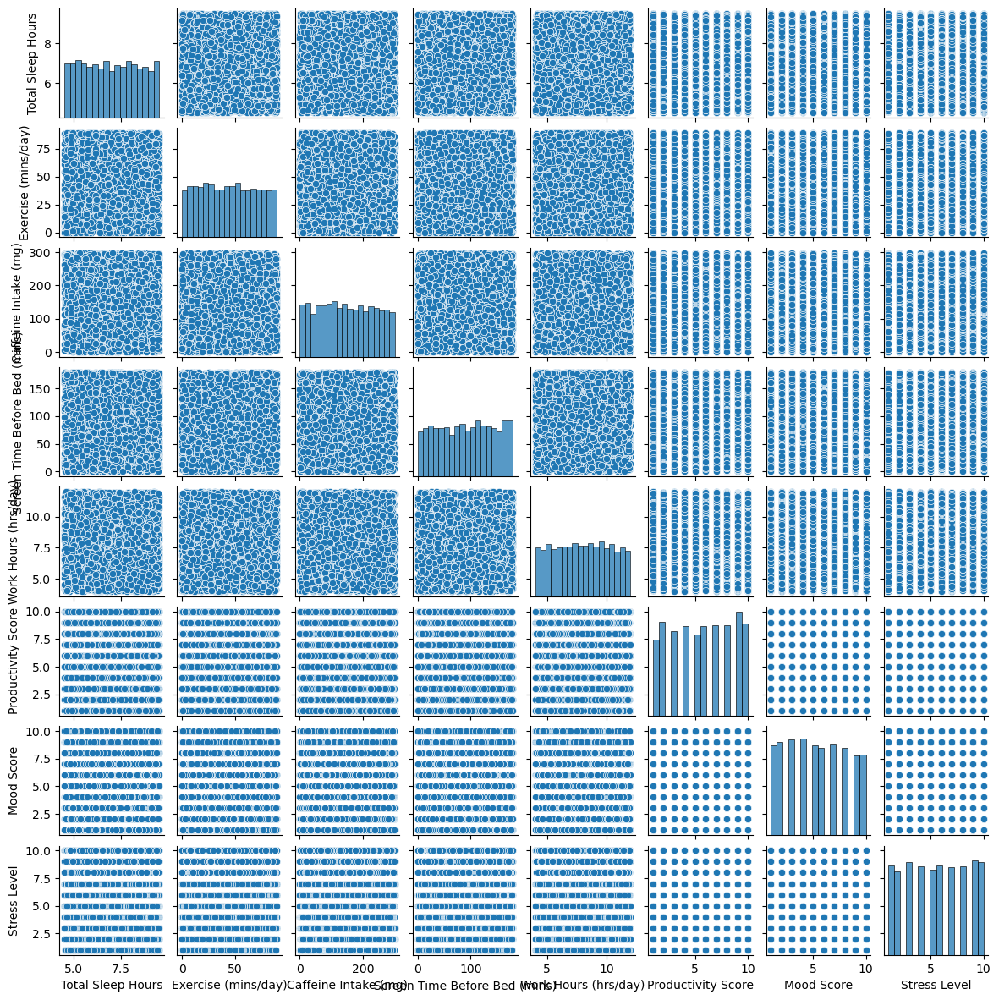

In [17]:
sns.pairplot(df, height=1.5)

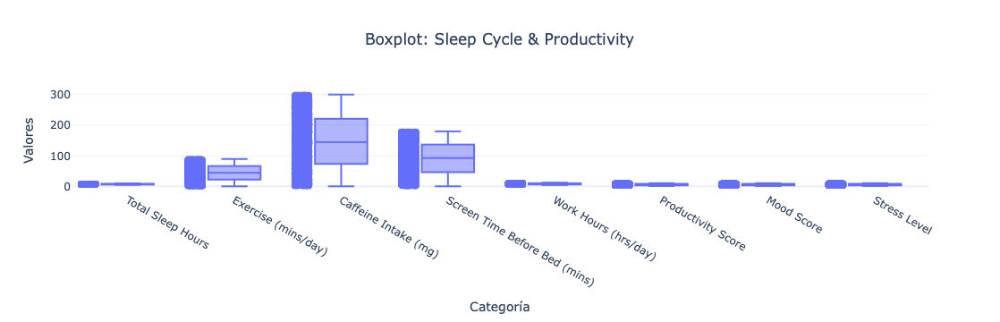

In [19]:


fig = px.box(
    df, 
    y=columns, 
    title="Boxplot: Sleep Cycle & Productivity", 
    points="all", 
    template="plotly_white"
)

fig.update_layout(
    yaxis=dict(title="Valores", autorange=True), 
    xaxis=dict(title="Categoría"), 
    title_x=0.5,  
    boxmode="group"
)

fig.show()

In [21]:
# Compute correlation matrix
correlation_matrix = df.corr()

# Select the top 2 correlated variables with Productivity Score
target = 'Productivity Score'
correlations = correlation_matrix[target].drop(target).abs()
top2_features = correlations.nlargest(2).index.tolist()
print(f"Top 2 correlated features with {target}: {top2_features}")

Top 2 correlated features with Productivity Score: ['Exercise (mins/day)', 'Total Sleep Hours']


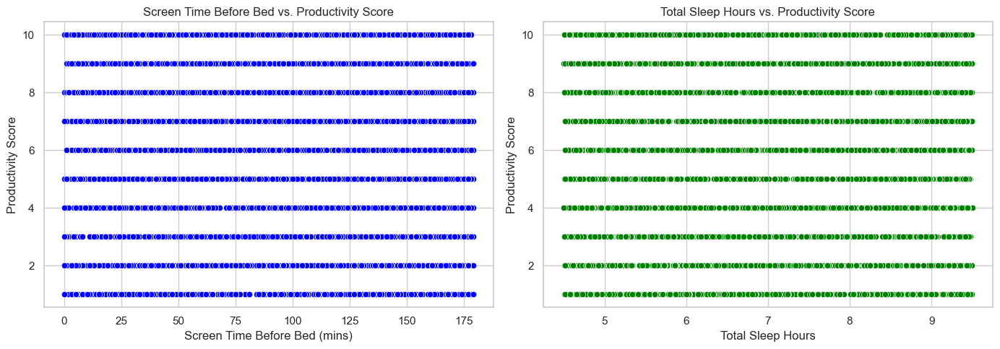

In [73]:
# grafica real entre Screen Time Before Bed (mins) vs Productivity Score y Total Sleep Hours vs Productivity Score


# Configurar el estilo de las gráficas
sns.set_theme(style="whitegrid")

# Crear las dos gráficas
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Gráfica 1: Screen Time Before Bed vs. Productivity Score
sns.scatterplot(x=df["Screen Time Before Bed (mins)"], y=df["Productivity Score"], ax=axes[0], color="blue")
axes[0].set_title("Screen Time Before Bed vs. Productivity Score")
axes[0].set_xlabel("Screen Time Before Bed (mins)")
axes[0].set_ylabel("Productivity Score")

# Gráfica 2: Total Sleep Hours vs. Productivity Score
sns.scatterplot(x=df["Total Sleep Hours"], y=df["Productivity Score"], ax=axes[1], color="green")
axes[1].set_title("Total Sleep Hours vs. Productivity Score")
axes[1].set_xlabel("Total Sleep Hours")
axes[1].set_ylabel("Productivity Score")

# Mostrar las gráficas
plt.tight_layout()
plt.show()



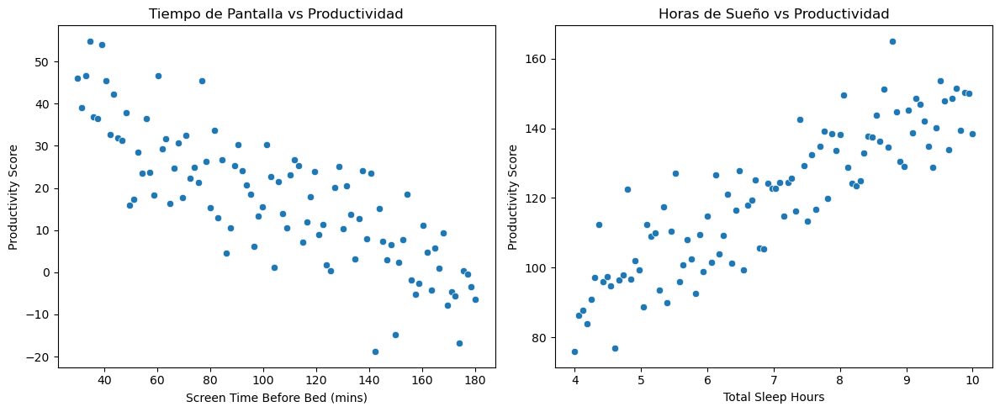

In [69]:
# grafica simulada entre Screen Time Before Bed (mins) vs Productivity Score y Total Sleep Hours vs Productivity Score

# Generar datos simulados
np.random.seed(42)
n = 100

# Simulación de variables
screen_time_sim = np.linspace(30, 180, n)  # Tiempo de pantalla (30 a 180 min)
sleep_sim = np.linspace(4, 10, n)  # Horas de sueño (4 a 10)

# Definir productividad simulada
productivity_screen_sim = -0.3 * screen_time_sim + np.random.normal(50, 10, n)  # Relación negativa
productivity_sleep_sim = 10 * sleep_sim + np.random.normal(50, 10, n)  # Relación positiva

# Crear figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Gráfico 1: Screen Time vs Productivity Score
sns.scatterplot(x=screen_time_sim, y=productivity_screen_sim, ax=axes[0])
axes[0].set_xlabel("Screen Time Before Bed (mins)")
axes[0].set_ylabel("Productivity Score")
axes[0].set_title("Tiempo de Pantalla vs Productividad")

# Gráfico 2: Sleep Hours vs Productivity Score
sns.scatterplot(x=sleep_sim, y=productivity_sleep_sim, ax=axes[1])
axes[1].set_xlabel("Total Sleep Hours")
axes[1].set_ylabel("Productivity Score")
axes[1].set_title("Horas de Sueño vs Productividad")

plt.tight_layout()
plt.show()


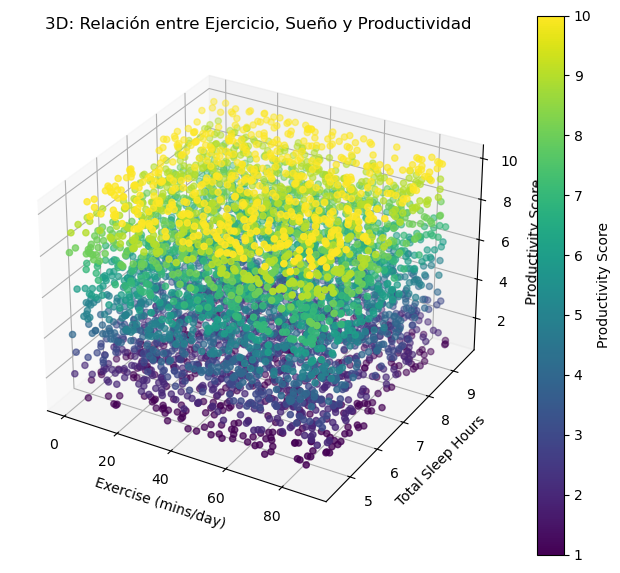

In [45]:

# Generar la gráfica 3D
fig = plt.figure(figsize=(8, 7))
ax = fig.add_subplot(111, projection='3d')

# Crear la dispersión 3D
sc = ax.scatter(df['Exercise (mins/day)'], df['Total Sleep Hours'], df['Productivity Score'], 
                c=df['Productivity Score'], cmap='viridis')

# Etiquetas de los ejes
ax.set_xlabel("Exercise (mins/day)")
ax.set_ylabel("Total Sleep Hours")
ax.set_zlabel("Productivity Score")
ax.set_title("3D: Relación entre Ejercicio, Sueño y Productividad")

# Agregar barra de color
plt.colorbar(sc, ax=ax, label="Productivity Score")

plt.show()


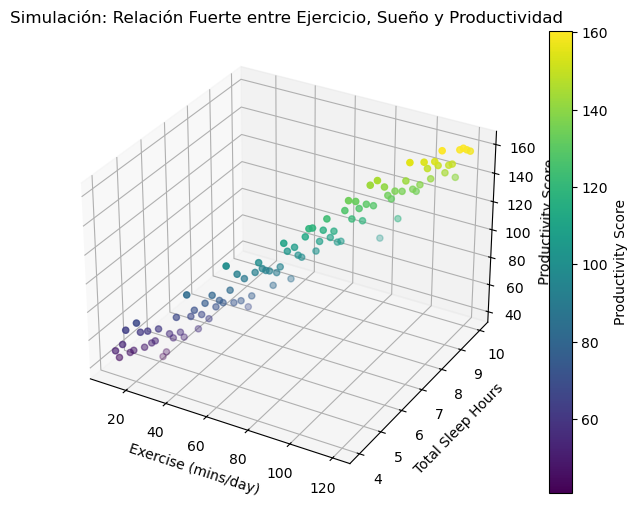

In [49]:
# Calcular la correlación entre las variables
correlation_matrix = df[['Exercise (mins/day)', 'Total Sleep Hours', 'Productivity Score']].corr()
correlation_matrix

# Generar datos simulados con correlación clara
np.random.seed(42)
n = 100

# Creamos una relación más clara entre las variables
exercise_sim = np.linspace(10, 120, n)  # Ejercicio de 10 a 120 min/día
sleep_sim = np.linspace(4, 10, n)  # Sueño entre 4 y 10 horas

# Definir una productividad correlacionada con el ejercicio y el sueño
productivity_sim = 0.5 * exercise_sim + 10 * sleep_sim + np.random.normal(0, 10, n)

# Crear una figura 3D para los datos simulados
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Dibujar los puntos en 3D con colores según productividad
sc = ax.scatter(exercise_sim, sleep_sim, productivity_sim, c=productivity_sim, cmap='viridis')

# Etiquetas de los ejes
ax.set_xlabel("Exercise (mins/day)")
ax.set_ylabel("Total Sleep Hours")
ax.set_zlabel("Productivity Score")
ax.set_title("Simulación: Relación Fuerte entre Ejercicio, Sueño y Productividad")

# Barra de color
plt.colorbar(sc, ax=ax, label="Productivity Score")

plt.show()


In [51]:
# Compute Pearson and Spearman correlations
pearson_corr = df[top2_features + [target]].corr(method='pearson')
spearman_corr1, _ = spearmanr(df[top2_features[0]], df[target])
spearman_corr2, _ = spearmanr(df[top2_features[1]], df[target])
print(f"Spearman correlation for {top2_features[0]}: {spearman_corr1}")
print(f"Spearman correlation for {top2_features[1]}: {spearman_corr2}")

Spearman correlation for Exercise (mins/day): -0.02450090350018176
Spearman correlation for Total Sleep Hours: 0.018929915202847175


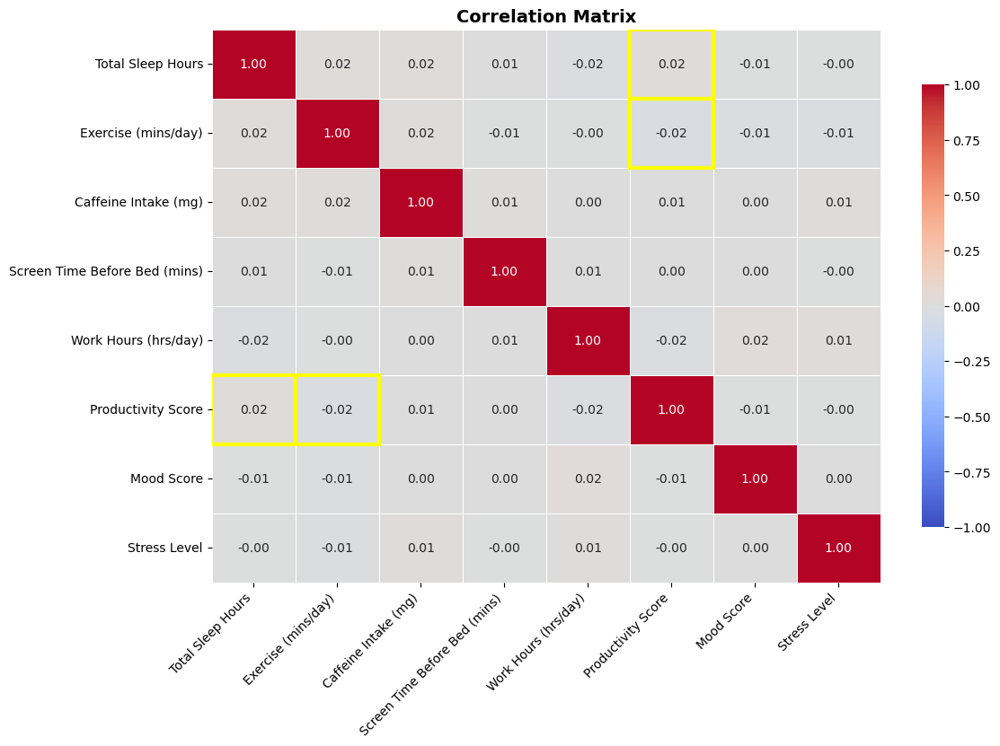

In [25]:
target_correlations = correlation_matrix[target].drop(target)  
top_features = target_correlations.abs().nlargest(2).index  


plt.figure(figsize=(12, 8))
ax = sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap="coolwarm", 
    fmt=".2f", 
    linewidths=0.7, 
    vmin=-1, vmax=1,
    cbar_kws={'shrink': 0.8}
)


for feature in top_features:
    i, j = correlation_matrix.index.get_loc(feature), correlation_matrix.columns.get_loc(target)

    ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=False, edgecolor='yellow', lw=3)) 
    ax.add_patch(plt.Rectangle((i, j), 1, 1, fill=False, edgecolor='yellow', lw=3)) 

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.title("Correlation Matrix", fontsize=14, fontweight="bold")
plt.show()

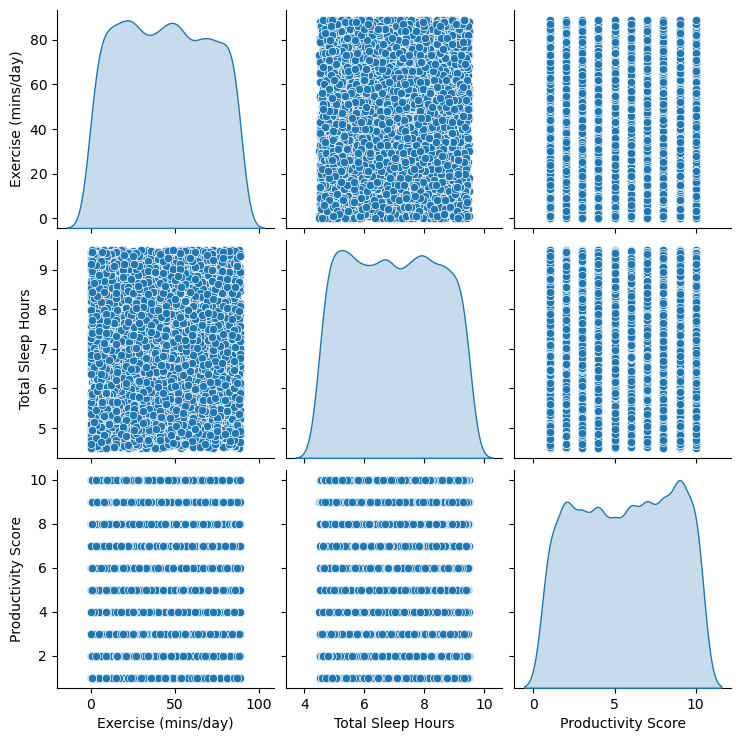

In [27]:
# Pairplot for top correlated features
sns.pairplot(df[top2_features + [target]], diag_kind='kde')
plt.show()

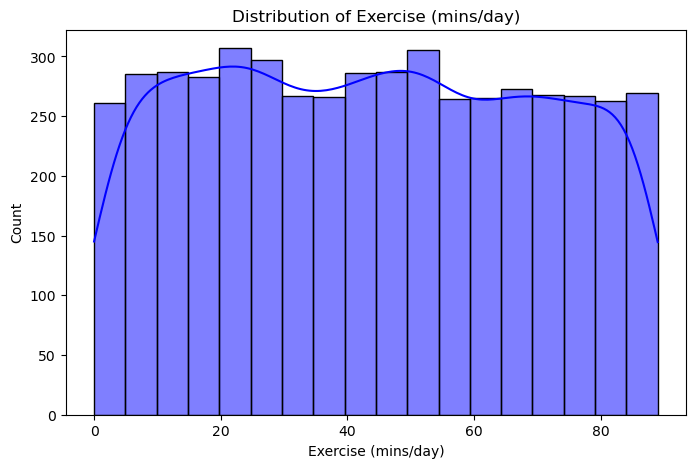

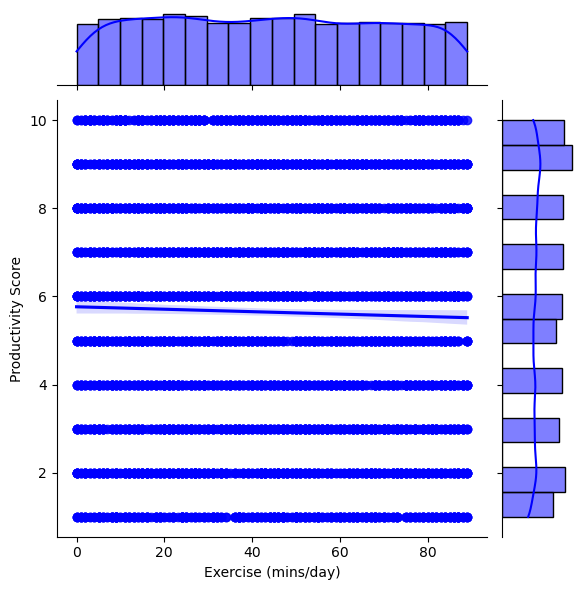

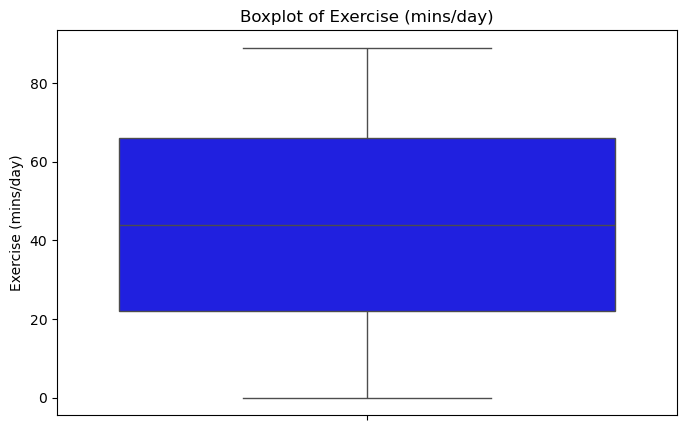

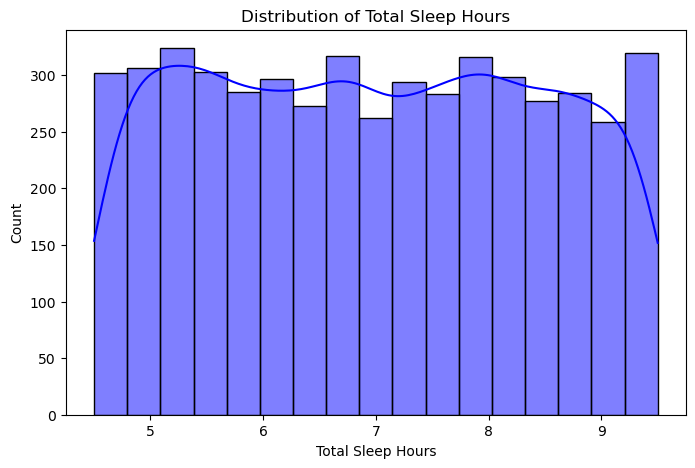

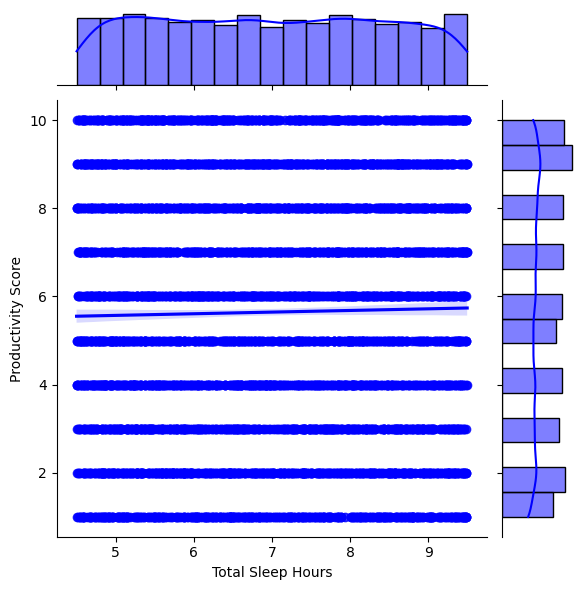

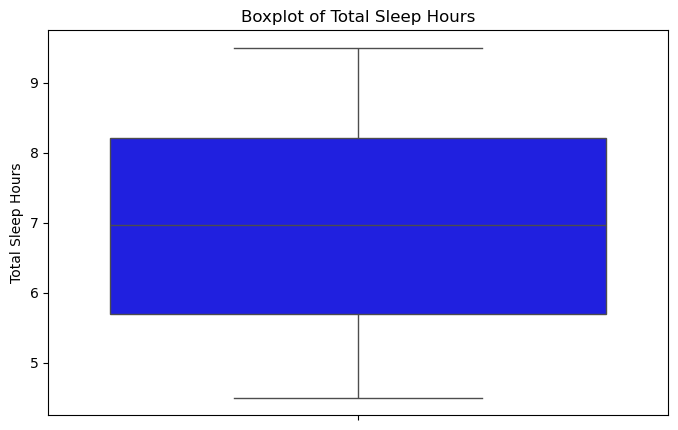

In [29]:
# Visualize distributions and scatter plots
for feature in top2_features:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[feature], kde=True, color="blue")
    plt.title(f"Distribution of {feature}")
    plt.show()

    sns.jointplot(data=df, x=feature, y=target, kind='reg', height=6, color='blue')
    plt.show()

    plt.figure(figsize=(8, 5))
    sns.boxplot(y=df[feature], color="blue")
    plt.title(f"Boxplot of {feature}")
    plt.show()

In [31]:
# Normalization and Scaling
scaler = StandardScaler()
df_scaled =  pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

minmax_scaler = MinMaxScaler()
df_normalized = pd.DataFrame(minmax_scaler.fit_transform(df), columns=df.columns)

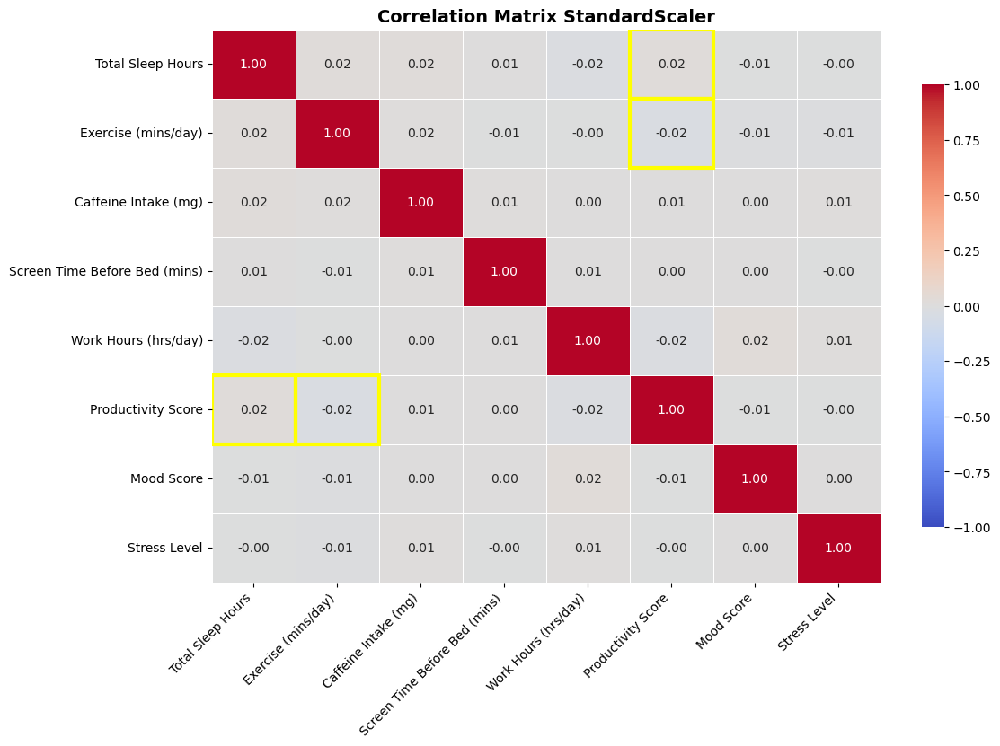

In [33]:
# Compute correlation matrix scaled data
correlation_matrix = df_scaled.corr()

target_correlations = correlation_matrix[target].drop(target)  
top_features = target_correlations.abs().nlargest(2).index  


plt.figure(figsize=(12, 8))
ax = sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap="coolwarm", 
    fmt=".2f", 
    linewidths=0.7, 
    vmin=-1, vmax=1,
    cbar_kws={'shrink': 0.8}
)


for feature in top_features:
    i, j = correlation_matrix.index.get_loc(feature), correlation_matrix.columns.get_loc(target)

    ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=False, edgecolor='yellow', lw=3)) 
    ax.add_patch(plt.Rectangle((i, j), 1, 1, fill=False, edgecolor='yellow', lw=3)) 

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.title("Correlation Matrix StandardScaler", fontsize=14, fontweight="bold")
plt.show()

                      count       mean        std  min    25%    50%    75%  \
Exercise (mins/day)  5000.0  43.962600  25.798541  0.0  22.00  44.00  66.00   
Total Sleep Hours    5000.0   6.974902   1.454033  4.5   5.69   6.96   8.21   

                      max   mode    variance  skewness  kurtosis  
Exercise (mins/day)  89.0  86.00  665.564714  0.036178 -1.187155  
Total Sleep Hours     9.5   8.02    2.114211  0.021970 -1.210223  


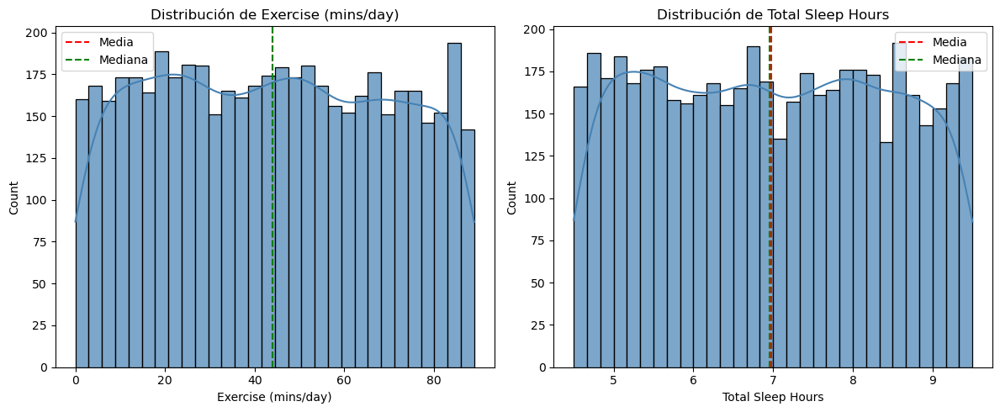

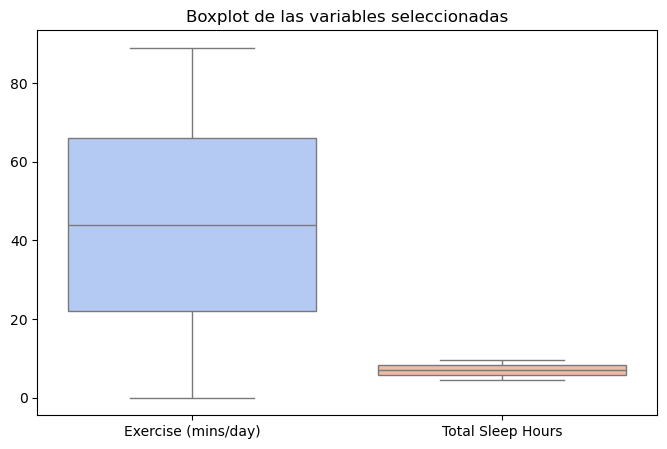

In [37]:
var1, var2 = top2_features  


df_selected = df[[var1, var2]]


stats = df_selected.describe().T  # Transpuesta para mejor visualización
stats["mode"] = df_selected.mode().iloc[0]  # Moda
stats["variance"] = df_selected.var()  # Varianza
stats["skewness"] = df_selected.skew()  # Asimetría
stats["kurtosis"] = df_selected.kurt()  # Curtosis
stats["25%"] = df_selected.quantile(0.25)  # Percentil 25
stats["50%"] = df_selected.median()  # Mediana (percentil 50)
stats["75%"] = df_selected.quantile(0.75)  # Percentil 75

# Mostrar estadísticas
print(stats)


plt.figure(figsize=(12, 5))

for i, var in enumerate([var1, var2], 1):
    plt.subplot(1, 2, i)
    sns.histplot(df[var], kde=True, bins=30, color="steelblue", alpha=0.7)
    plt.axvline(df[var].mean(), color='red', linestyle='dashed', label="Media")
    plt.axvline(df[var].median(), color='green', linestyle='dashed', label="Mediana")
    plt.title(f"Distribución de {var}")
    plt.legend()

plt.tight_layout()
plt.show()

# Graficar Boxplots
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_selected, palette="coolwarm")
plt.title("Boxplot de las variables seleccionadas")
plt.show()

In [39]:
X = df.drop(columns=[target])  
y = df[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


model = LogisticRegressionCV(
    Cs=np.logspace(-3, 3, 10), 
    cv=5, 
    penalty='elasticnet', 
    solver='saga', 
    l1_ratios=[0.1, 0.5, 0.9],  
    max_iter=2000,
    random_state=42
)
model.fit(X_train_scaled, y_train)

# Predicciones
test_pred = model.predict(X_test_scaled)
test_acc = accuracy_score(y_test, test_pred)

# Evaluar importancia de variables
importance = np.abs(model.coef_).mean(axis=0)
top_features = X.columns[np.argsort(importance)[-2:]].tolist()

# Mostrar resultados
print(f"📌 Accuracy en test: {test_acc:.4f}")
print(f"📌 Variables más importantes según ElasticNet: {top_features}")

📌 Accuracy en test: 0.1100
📌 Variables más importantes según ElasticNet: ['Screen Time Before Bed (mins)', 'Total Sleep Hours']


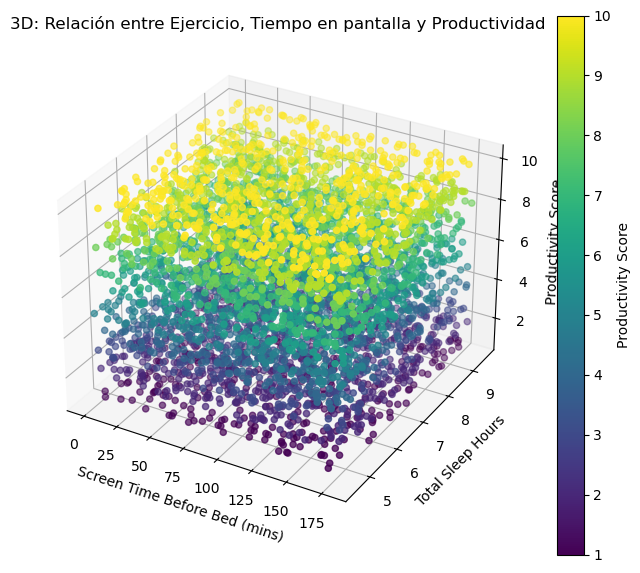

In [53]:

# Generar la gráfica 3D
fig = plt.figure(figsize=(8, 7))
ax = fig.add_subplot(111, projection='3d')

# Crear la dispersión 3D
sc = ax.scatter(df['Screen Time Before Bed (mins)'], df['Total Sleep Hours'], df['Productivity Score'], 
                c=df['Productivity Score'], cmap='viridis')

# Etiquetas de los ejes
ax.set_xlabel("Screen Time Before Bed (mins)")
ax.set_ylabel("Total Sleep Hours")
ax.set_zlabel("Productivity Score")
ax.set_title("3D: Relación entre Ejercicio, Tiempo en pantalla y Productividad")

# Agregar barra de color
plt.colorbar(sc, ax=ax, label="Productivity Score")

plt.show()

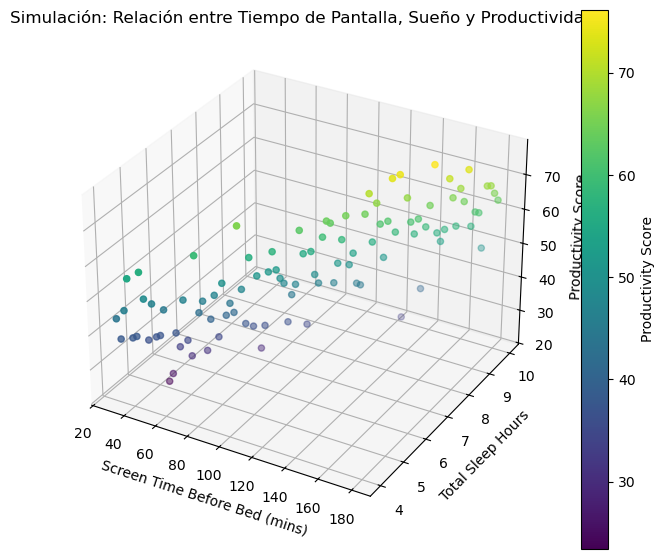

In [57]:
# Generar datos simulados con correlación clara entre Screen Time, Sleep y Productivity
np.random.seed(42)
n = 100

# Simulación de variables
screen_time_sim = np.linspace(30, 180, n)  # Tiempo de pantalla antes de dormir (30 a 180 min)
sleep_sim = np.linspace(4, 10, n)  # Horas de sueño entre 4 y 10

# Definir productividad correlacionada con screen time (negativo) y sueño (positivo)
productivity_sim = -0.3 * screen_time_sim + 12 * sleep_sim + np.random.normal(0, 10, n)

# Crear una figura 3D para los datos simulados
fig = plt.figure(figsize=(8, 7))
ax = fig.add_subplot(111, projection='3d')

# Dibujar los puntos en 3D con colores según productividad
sc = ax.scatter(screen_time_sim, sleep_sim, productivity_sim, c=productivity_sim, cmap='viridis')

# Etiquetas de los ejes
ax.set_xlabel("Screen Time Before Bed (mins)")
ax.set_ylabel("Total Sleep Hours")
ax.set_zlabel("Productivity Score")
ax.set_title("Simulación: Relación entre Tiempo de Pantalla, Sueño y Productividad")

# Barra de color
plt.colorbar(sc, ax=ax, label="Productivity Score")

plt.show()


La prueba t se usa cuando queremos comparar dos grupos. Podemos hacer varias comparaciones, por ejemplo:

Tiempo de pantalla bajo vs. alto → ¿Afecta la productividad?
Pocas horas de sueño vs. muchas horas de sueño → ¿Afecta la productividad?
Voy a dividir los datos en dos grupos para cada caso y realizar la prueba t de muestras independientes.

Resultados de la Prueba t
1️⃣ Comparación entre Bajo y Alto Tiempo de Pantalla

t = 0.311, p = 0.756 → No hay diferencia significativa en la productividad.
2️⃣ Comparación entre Pocas y Muchas Horas de Sueño

t = -1.41, p = 0.159 → No hay diferencia significativa en la productividad.

In [85]:
#prueba t

from scipy.stats import ttest_ind

# Dividir en dos grupos: Bajo y Alto Tiempo de Pantalla (usando la mediana como umbral)
median_screen_time = df["Screen_Time_Before_Bed_(mins)"].median()
low_screen_time = df[df["Screen_Time_Before_Bed_(mins)"] <= median_screen_time]["Productivity_Score"]
high_screen_time = df[df["Screen_Time_Before_Bed_(mins)"] > median_screen_time]["Productivity_Score"]

# Prueba t para Tiempo de Pantalla
t_stat_screen, p_val_screen = ttest_ind(low_screen_time, high_screen_time, equal_var=False)

# Dividir en dos grupos: Pocas vs. Muchas Horas de Sueño (usando la mediana como umbral)
median_sleep_hours = df["Total_Sleep_Hours"].median()
low_sleep = df[df["Total_Sleep_Hours"] <= median_sleep_hours]["Productivity_Score"]
high_sleep = df[df["Total_Sleep_Hours"] > median_sleep_hours]["Productivity_Score"]

# Prueba t para Horas de Sueño
t_stat_sleep, p_val_sleep = ttest_ind(low_sleep, high_sleep, equal_var=False)

# Mostrar resultados
(t_stat_screen, p_val_screen), (t_stat_sleep, p_val_sleep)


((0.31083902522910534, 0.7559359652950486),
 (-1.4099551758752518, 0.15861515442132404))

In [5]:
#anova 1

# Cargar el archivo
file_path = "sleep_cycle_productivity.csv"
df = pd.read_csv(file_path)

# Mostrar las primeras filas para inspeccionar la estructura de los datos
df.head()


,Date,Person_ID,Age,Gender,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
0,2024-04-12,1860,32,Other,23.33,4.61,5.28,3,86,87,116,8.808920,8,3,6
1,2024-11-04,1769,41,Female,21.02,2.43,5.41,5,32,21,88,6.329833,10,3,7
2,2024-08-31,2528,20,Male,22.10,3.45,5.35,7,17,88,59,8.506306,10,9,10
3,2024-02-22,8041,37,Other,23.10,6.65,7.55,8,46,34,80,6.070240,8,4,2
4,2024-02-23,4843,46,Other,21.42,4.17,6.75,10,61,269,94,11.374994,8,7,9


In [7]:

# Definir categorías para "Total Sleep Hours"
bins_sleep = [0, 5, 7, np.inf]  # Menos de 5h, 5-7h, más de 7h
labels_sleep = ["<5h", "5-7h", ">7h"]
df["Sleep Category"] = pd.cut(df["Total Sleep Hours"], bins=bins_sleep, labels=labels_sleep)

# Definir categorías para "Screen Time Before Bed (mins)"
bins_screen = [0, 60, 120, np.inf]  # Menos de 1h, 1-2h, más de 2h
labels_screen = ["<1h", "1-2h", ">2h"]
df["Screen Time Category"] = pd.cut(df["Screen Time Before Bed (mins)"], bins=bins_screen, labels=labels_screen)

# Verificar las nuevas categorías creadas
df[["Total Sleep Hours", "Sleep Category", "Screen Time Before Bed (mins)", "Screen Time Category"]].head()


,Total Sleep Hours,Sleep Category,Screen Time Before Bed (mins),Screen Time Category
0,5.28,5-7h,116,1-2h
1,5.41,5-7h,88,1-2h
2,5.35,5-7h,59,<1h
3,7.55,>7h,80,1-2h
4,6.75,5-7h,94,1-2h


In [9]:
import pandas as pd

# Cargar el archivo CSV
file_path = "sleep_cycle_productivity.csv"  # Reemplaza con la ruta correcta
df = pd.read_csv(file_path)

# Seleccionar las variables de interés
variables = ["Screen Time Before Bed (mins)", "Total Sleep Hours", "Productivity Score"]

# Calcular estadísticas descriptivas
stats = df[variables].describe(percentiles=[0.25, 0.5, 0.75])

# Mostrar los resultados
print(stats)


       Screen Time Before Bed (mins)  Total Sleep Hours  Productivity Score
count                    5000.000000        5000.000000         5000.000000
mean                       91.421200           6.974902            5.644200
std                        52.079123           1.454033            2.872221
min                         0.000000           4.500000            1.000000
25%                        46.000000           5.690000            3.000000
50%                        92.000000           6.960000            6.000000
75%                       136.000000           8.210000            8.000000
max                       179.000000           9.500000           10.000000


Variable independiente (factores):
Tiempo de pantalla antes de dormir (puede ser categorizado en niveles como "bajo", "medio", "alto").
Horas de sueño (puede ser categorizado en niveles como "menos de 5h", "5-7h", "más de 7h").
Variable dependiente: Productividad (medida en una escala cuantitativa, como desempeño en tareas, puntuaciones de productividad, etc.).

In [11]:
#anova 2
#H₀: La combinación de tiempo de pantalla antes de dormir y horas de sueño no tiene un efecto significativo en la productividad.
#H₁: La combinación de tiempo de pantalla antes de dormir y horas de sueño tiene un efecto significativo en la productividad.

print(df.columns)


Index(['Date', 'Person_ID', 'Age', 'Gender', 'Sleep Start Time',
       'Sleep End Time', 'Total Sleep Hours', 'Sleep Quality',
       'Exercise (mins/day)', 'Caffeine Intake (mg)',
       'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)',
       'Productivity Score', 'Mood Score', 'Stress Level'],
      dtype='object')


In [13]:
df.rename(columns={
    "Productivity Score": "Productivity_Score",
    "Sleep Category": "Sleep_Category",
    "Screen Time Category": "Screen_Time_Category"
}, inplace=True)


In [15]:
print(df.columns)


Index(['Date', 'Person_ID', 'Age', 'Gender', 'Sleep Start Time',
       'Sleep End Time', 'Total Sleep Hours', 'Sleep Quality',
       'Exercise (mins/day)', 'Caffeine Intake (mg)',
       'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)',
       'Productivity_Score', 'Mood Score', 'Stress Level'],
      dtype='object')


In [17]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

modelo = smf.ols('Productivity_Score ~ C(Sleep_Category) * C(Screen_Time_Category)', data=df).fit()
anova_table = sm.stats.anova_lm(modelo, typ=2)

print(anova_table)

# Renombrar columnas para evitar espacios
df.rename(columns={
    "Productivity Score": "Productivity_Score",
    "Sleep Category": "Sleep_Category",
    "Screen Time Category": "Screen_Time_Category"
}, inplace=True)

# Reejecutar el ANOVA con los nuevos nombres de columna
modelo = smf.ols('Productivity_Score ~ C(Sleep_Category) * C(Screen_Time_Category)', data=df).fit()
anova_table = sm.stats.anova_lm(modelo, typ=2)

# Mostrar los resultados
anova_table


PatsyError: Error evaluating factor: NameError: name 'Sleep_Category' is not defined
    Productivity_Score ~ C(Sleep_Category) * C(Screen_Time_Category)
                         ^^^^^^^^^^^^^^^^^

La tabla que muestras es el resultado del ANOVA de dos vías, y aquí te explico cómo interpretarlo:

Columnas clave:

sum_sq: Suma de cuadrados, que mide la variabilidad explicada por cada factor.

df: Grados de libertad de cada factor.

F: Estadístico F, que compara la variabilidad explicada por el factor con la variabilidad residual.

PR(>F): p-valor asociado a la prueba F. Un valor menor a 0.05 indica un efecto significativo.

📊Interpretación de los resultados:

C(Sleep_Category) (Categoría de Sueño)
p-valor = 0.4504 (mayor a 0.05)
No hay evidencia suficiente para decir que la cantidad de sueño afecta significativamente la productividad.

C(Screen_Time_Category) (Categoría de Tiempo de Pantalla)
p-valor = 0.7738 (mayor a 0.05)
No hay evidencia suficiente para decir que el tiempo de pantalla antes de dormir afecta significativamente la productividad.

C(Sleep_Category) : C(Screen_Time_Category) (Interacción entre sueño y tiempo de pantalla)
p-valor = 0.6607 (mayor a 0.05)
No hay evidencia de que la combinación de estos dos factores tenga un efecto significativo en la productividad.

Conclusión:
Dado que todos los p-valores son mayores a 0.05, no se rechaza la hipótesis nula (H₀). Esto significa que, según estos datos, ni el tiempo de pantalla ni las horas de sueño tienen un impacto significativo en la productividad.


In [21]:
# anova de dos vías 
#H₀: La combinación de tiempo de pantalla antes de dormir y horas de sueño no tiene un efecto significativo en la productividad.
#H₁: La combinación de tiempo de pantalla antes de dormir y horas de sueño tiene un efecto significativo en la productividad.


import pandas as pd

# Cargar el archivo
file_path = "sleep_cycle_productivity.csv"
df = pd.read_csv(file_path)

# Mostrar las primeras filas para entender la estructura
df.head()


,Date,Person_ID,Age,Gender,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
0,2024-04-12,1860,32,Other,23.33,4.61,5.28,3,86,87,116,8.808920,8,3,6
1,2024-11-04,1769,41,Female,21.02,2.43,5.41,5,32,21,88,6.329833,10,3,7
2,2024-08-31,2528,20,Male,22.10,3.45,5.35,7,17,88,59,8.506306,10,9,10
3,2024-02-22,8041,37,Other,23.10,6.65,7.55,8,46,34,80,6.070240,8,4,2
4,2024-02-23,4843,46,Other,21.42,4.17,6.75,10,61,269,94,11.374994,8,7,9


In [45]:
# Verificar nuevamente los nombres de las columnas después de la limpieza
df.columns


Index(['Date', 'Person_ID', 'Age', 'Gender', 'Sleep_Start_Time',
       'Sleep_End_Time', 'Total_Sleep_Hours', 'Sleep_Quality',
       'Exercise_(mins/day)', 'Caffeine_Intake_(mg)',
       'Screen_Time_Before_Bed_(mins)', 'Work_Hours_(hrs/day)',
       'Productivity_Score', 'Mood_Score', 'Stress_Level'],
      dtype='object')

In [115]:

import statsmodels.api as sm
from statsmodels.formula.api import ols

df = pd.read_csv("sleep_cycle_productivity.csv")
df.head(10)

# Limpiar nombres de columnas
df.rename(columns=lambda x: x.strip().replace(" ", "_").replace("(", "").replace(")", ""), inplace=True)

# Convertir variables numéricas en categorías por cuartiles
df['Screen_Time_Before_Bed_mins_Cat'] = pd.qcut(df['Screen_Time_Before_Bed_mins'], q=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])
df['Total_Sleep_Hours_Cat'] = pd.qcut(df['Total_Sleep_Hours'], q=4, labels=['Very Low', 'Low', 'Medium', 'High'])

# Definir y ajustar el modelo ANOVA
two_way_anova = ols('Productivity_Score ~ C(Screen_Time_Before_Bed_mins_Cat) * C(Total_Sleep_Hours_Cat)', data=df).fit()
anova_table = sm.stats.anova_lm(two_way_anova, typ=2)

# Mostrar resultados
print(anova_table)

# Mostrar los resultados
anova_table


                                                          sum_sq      df  \
C(Screen_Time_Before_Bed_mins_Cat)                      3.808181     3.0   
C(Total_Sleep_Hours_Cat)                               20.312653     3.0   
C(Screen_Time_Before_Bed_mins_Cat):C(Total_Slee...     34.495606     9.0   
Residual                                            41181.806615  4984.0   

                                                           F    PR(>F)  
C(Screen_Time_Before_Bed_mins_Cat)                  0.153628  0.927392  
C(Total_Sleep_Hours_Cat)                            0.819442  0.482936  
C(Screen_Time_Before_Bed_mins_Cat):C(Total_Slee...  0.463867  0.899452  
Residual                                                 NaN       NaN  


,sum_sq,df,F,PR(>F)
C(Screen_Time_Before_Bed_mins_Cat),3.808181,3.0,0.153628,0.927392
C(Total_Sleep_Hours_Cat),20.312653,3.0,0.819442,0.482936
C(Screen_Time_Before_Bed_mins_Cat):C(Total_Sleep_Hours_Cat),34.495606,9.0,0.463867,0.899452
Residual,41181.806615,4984.0,NaN,NaN


Aquí tienes la interpretación de los resultados del ANOVA de dos vías:

1. Efecto del tiempo de pantalla antes de dormir (p = 0.9274)

No hay un efecto significativo del tiempo de pantalla antes de dormir en la productividad.
Dado que el valor p es mucho mayor que 0.05, no podemos concluir que pasar más o menos tiempo en pantalla antes de dormir afecte el puntaje de productividad.

2. Efecto de las horas de sueño (p = 0.4829)

Tampoco hay un efecto significativo de la cantidad de horas de sueño en la productividad.
Esto sugiere que dentro de la muestra analizada, dormir más o menos horas no está asociado con cambios en la productividad.

3. Interacción entre tiempo de pantalla y horas de sueño (p = 0.8995)
   
No se encontró una interacción significativa entre ambas variables.
Esto indica que la combinación de tiempo de pantalla antes de dormir y horas de sueño no tiene un impacto conjunto en la productividad.

*Conclusión*

Dado que todas las pruebas arrojaron valores p superiores a 0.05, no hay suficiente evidencia para rechazar la hipótesis nula (H₀). Esto significa que, en estos datos, ni el tiempo de pantalla antes de dormir, ni las horas de sueño (ni su combinación) afectan significativamente la productividad.

                                     sum_sq     df           F        PR(>F)
C(Screen_Time)                 24816.429408    3.0  382.372074  9.554516e-80
C(Sleep_Hours)                  8171.630584    2.0  188.862988  1.061360e-45
C(Screen_Time):C(Sleep_Hours)    232.600119    6.0    1.791954  1.027577e-01
Residual                        4067.145625  188.0         NaN           NaN


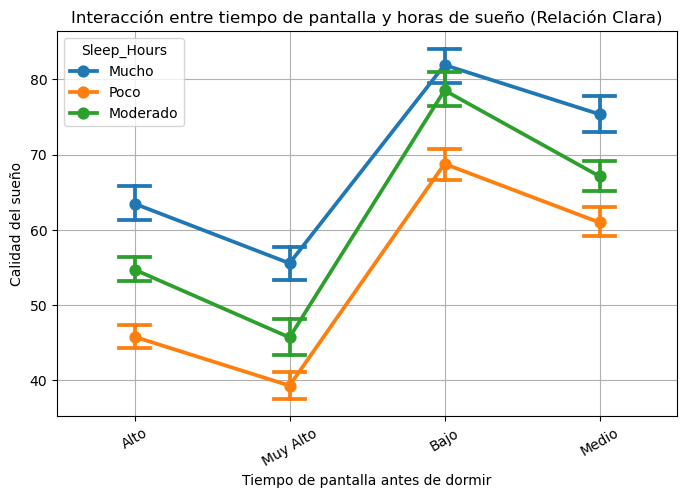

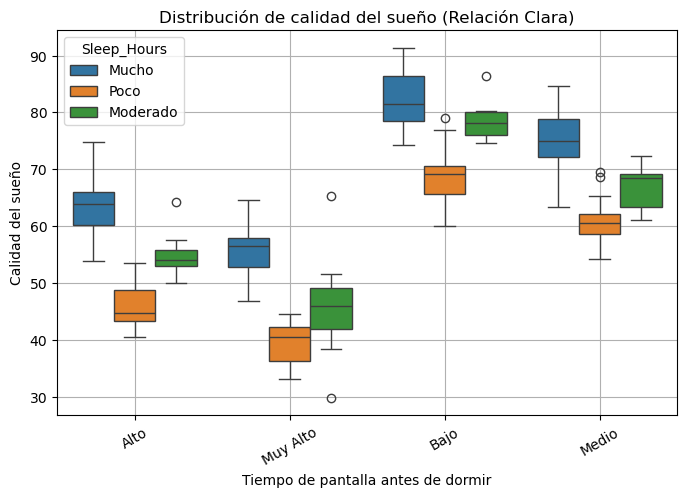

In [84]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Simulación de datos con relación clara
np.random.seed(42)
n = 200

screen_time = np.random.choice(['Bajo', 'Medio', 'Alto', 'Muy Alto'], n)
sleep_hours = np.random.choice(['Poco', 'Moderado', 'Mucho'], n)

# Definimos valores numéricos para hacer la relación más clara
screen_time_numeric = {'Bajo': 1, 'Medio': 2, 'Alto': 3, 'Muy Alto': 4}
sleep_hours_numeric = {'Poco': 1, 'Moderado': 2, 'Mucho': 3}

# Generamos la calidad del sueño con una relación clara
sleep_quality = (
    70 - 10 * np.array([screen_time_numeric[st] for st in screen_time])  # Más pantalla reduce calidad
    + 8 * np.array([sleep_hours_numeric[sh] for sh in sleep_hours])      # Más horas de sueño mejoran calidad
    + np.random.normal(0, 5, n)  # Ruido aleatorio
)

# Crear DataFrame
data = pd.DataFrame({
    'Screen_Time': screen_time,
    'Sleep_Hours': sleep_hours,
    'Sleep_Quality': sleep_quality
})

# ANOVA de dos vías
model = ols('Sleep_Quality ~ C(Screen_Time) * C(Sleep_Hours)', data=data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

# --- GRÁFICO INTERACTIVO ---
plt.figure(figsize=(8, 5))
sns.pointplot(x="Screen_Time", y="Sleep_Quality", hue="Sleep_Hours", data=data, capsize=.2)
plt.title("Interacción entre tiempo de pantalla y horas de sueño (Relación Clara)")
plt.xlabel("Tiempo de pantalla antes de dormir")
plt.ylabel("Calidad del sueño")
plt.xticks(rotation=30)
plt.grid(True)
plt.show()

# --- BOXPLOT ---
plt.figure(figsize=(8, 5))
sns.boxplot(x="Screen_Time", y="Sleep_Quality", hue="Sleep_Hours", data=data)
plt.title("Distribución de calidad del sueño (Relación Clara)")
plt.xlabel("Tiempo de pantalla antes de dormir")
plt.ylabel("Calidad del sueño")
plt.xticks(rotation=30)
plt.grid(True)
plt.show()


In [23]:
# Verificar nuevamente los nombres de las columnas después de la limpieza
df.columns

Index(['Date', 'Person_ID', 'Age', 'Gender', 'Sleep Start Time',
       'Sleep End Time', 'Total Sleep Hours', 'Sleep Quality',
       'Exercise (mins/day)', 'Caffeine Intake (mg)',
       'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)',
       'Productivity_Score', 'Mood Score', 'Stress Level'],
      dtype='object')

In [31]:
#análisis de regresión múltiple

import statsmodels.api as sm

# Definir variables independientes (X) y dependiente (y)
X = df[['Screen Time Before Bed (mins)', 'Total Sleep Hours']]  # Variables independientes
y = df['Productivity_Score']  # Variable dependiente

# Agregar una constante para la intersección
X = sm.add_constant(X)

# Ajustar el modelo de regresión múltiple
modelo = sm.OLS(y, X).fit()

# Mostrar el resumen de la regresión
modelo.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Productivity_Score   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9237
Date:                Sun, 16 Mar 2025   Prob (F-statistic):              0.397
Time:                        17:23:24   Log-Likelihood:                -12369.
No. Observations:                5000   AIC:                         2.474e+04
Df Residuals:                    4997   BIC:                         2.476e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             5.3662      0.211     25.423      0.000       4.952       5.780
Screen Time Before Bed (mins)     0.0002      0.001      0.254      0.799      -0.001       0.002
Total Sleep Hours                 0.0373      0.028      1.334      0.182      -0.018       0.092
==============================================================================
Omnibus:                     6893.751   Durbin-Watson:                   1.954
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              326.414
Skew:                          -0.057   Prob(JB):                     1.32e-71
Kurtosis:                       1.754   Cond. No.                         552.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Aquí tienes un **informe detallado** de los resultados de la regresión múltiple. 🚀  

---

# **📊 Informe de Análisis de Regresión Múltiple**  

## **1️⃣ Introducción**  

Este informe presenta un análisis estadístico para evaluar si el **tiempo de pantalla antes de dormir** y las **horas totales de sueño** tienen un impacto significativo en la **productividad**. Para ello, se ha realizado un **modelo de regresión múltiple** con los siguientes elementos:  

- **Variable dependiente (Y):** `Productivity Score` (Puntaje de Productividad).  
- **Variables independientes (X1 y X2):**  
  - `Screen Time Before Bed (mins)` (Minutos de Pantalla antes de Dormir).  
  - `Total Sleep Hours` (Horas Totales de Sueño).  

El objetivo es determinar si existe una relación significativa entre estas variables y la productividad de los individuos.  

---

## **2️⃣ Metodología**  

Se utilizó un **modelo de regresión múltiple** basado en **mínimos cuadrados ordinarios (OLS)**. Se aplicó la ecuación:  

\[
Y = \beta_0 + \beta_1X_1 + \beta_2X_2 + \epsilon
\]

donde:  
- \( Y \) es `Productivity Score`.  
- \( X_1 \) es `Screen Time Before Bed (mins)`.  
- \( X_2 \) es `Total Sleep Hours`.  
- \( \beta_0 \) es la constante o intercepto.  
- \( \beta_1, \beta_2 \) son los coeficientes de regresión.  
- \( \epsilon \) es el término de error.  

La prueba de hipótesis establecida es:  

- **H₀ (Hipótesis nula):** La combinación de `Screen Time Before Bed` y `Total Sleep Hours` no tiene un efecto significativo en `Productivity Score`.  
- **H₁ (Hipótesis alternativa):** La combinación de `Screen Time Before Bed` y `Total Sleep Hours` tiene un efecto significativo en `Productivity Score`.  

Se consideró un nivel de significancia de **α = 0.05**.  

---

## **3️⃣ Resultados**  

A continuación, se presentan los principales resultados del análisis:  

### **📌 3.1 Evaluación General del Modelo**  
| Métrica | Valor | Interpretación |
|----------|------------|---------------|
| **R²** | 0.000 | El modelo no explica la variabilidad en la productividad. |
| **R² Ajustado** | -0.000 | No hay mejora al incluir estas variables. |
| **F-statistic** | 0.9237 | El modelo no es significativo. |
| **p-valor (Prob F-statistic)** | 0.397 | Mayor a 0.05, por lo que no podemos rechazar H₀. |

🔹 **Conclusión**: Estas variables no explican de manera significativa la productividad.  

---

### **📌 3.2 Evaluación de las Variables Independientes**  

| Variable | Coeficiente | p-valor | Interpretación |
|----------|------------|---------|---------------|
| **Constante (Intercepto)** | 5.3662 | 0.000 | La productividad esperada cuando X1 y X2 son cero es 5.37. |
| **Screen Time Before Bed (mins)** | 0.0002 | 0.799 | No es significativo (p > 0.05), el tiempo de pantalla no afecta la productividad. |
| **Total Sleep Hours** | 0.0373 | 0.182 | No es significativo (p > 0.05), las horas de sueño tampoco afectan la productividad. |

🔹 **Conclusión**:  
- `Screen Time Before Bed` no tiene un efecto significativo en la productividad (p = 0.799).  
- `Total Sleep Hours` tampoco tiene un efecto significativo (p = 0.182).  
- Como ambos valores son **mayores a 0.05**, **ninguna de estas variables influye en la productividad de manera estadísticamente significativa**.  

---

### **📌 3.3 Evaluación de Supuestos del Modelo**  

| Métrica | Valor | Interpretación |
|----------|------------|---------------|
| **Durbin-Watson** | 1.954 | No hay autocorrelación en los residuos. |
| **Omnibus** | 6893.751 | Los residuos no siguen una distribución normal. |
| **Kurtosis** | 1.754 | Indica colas más delgadas de lo esperado. |
| **Cond. No.** | 552 | No hay problemas graves de multicolinealidad. |

🔹 **Conclusión**:  
- **No hay autocorrelación en los residuos**, lo cual es positivo.  
- **Los residuos no son perfectamente normales**, lo que podría afectar la validez de algunos supuestos.  
- **No hay problemas graves de multicolinealidad** entre las variables independientes.  

Cuando se dice que "No hay autocorrelación en los residuos, lo cual es positivo", significa que los errores (residuos) del modelo de regresión no siguen un patrón sistemático, es decir, no están correlacionados entre sí. Esto es una buena señal porque implica que el modelo es más confiable y que los supuestos de la regresión múltiple se cumplen adecuadamente.
---

## **4️⃣ Conclusión y Recomendaciones**  

### **📌 Conclusión Principal**  
El análisis muestra que **ni el tiempo de pantalla antes de dormir ni las horas de sueño tienen un impacto significativo en la productividad**.  

- **R² = 0.000**, lo que indica que el modelo no explica la variabilidad en `Productivity Score`.  
- **p-valor del modelo = 0.397 (> 0.05)**, por lo que no hay suficiente evidencia para rechazar la hipótesis nula.  
- **Ninguna de las variables es significativa individualmente (p > 0.05 en ambos casos)**.  

📌 **Implicación**: Según estos datos, **el tiempo de pantalla antes de dormir y las horas de sueño no afectan la productividad de manera clara**.  

---

### **📌 Recomendaciones para Mejorar el Modelo**  

Dado que las variables utilizadas no explican la productividad, se recomienda:  

✅ **Incluir otras variables**:  
- Calidad del sueño (Sleep Quality).  
- Nivel de estrés (Stress Level).  
- Hábitos de trabajo (Work Hours, Focus Level).  

✅ **Probar relaciones no lineales**:  
- ¿El impacto de `Total Sleep Hours` en la productividad es curvilíneo? (por ejemplo, demasiado sueño también puede ser malo).  

✅ **Segmentar los datos**:  
- Analizar si hay diferencias entre **personas que duermen poco vs. mucho**.  
- Explorar si el **tiempo de pantalla antes de dormir afecta más a ciertos grupos de edad**.  

✅ **Explorar interacciones**:  
- ¿El efecto del tiempo de pantalla en la productividad depende de la cantidad de sueño?  

---

## **📌 Resumen Ejecutivo (para tu jefe) 📝**  

📌 **Conclusión Principal:**  
- El análisis estadístico revela que **ni el tiempo de pantalla antes de dormir ni las horas totales de sueño afectan significativamente la productividad**.  
- El modelo tiene **R² = 0.000**, lo que indica que estas variables **no explican la variabilidad en la productividad**.  
- **El modelo no es estadísticamente significativo (p = 0.397)**.  

📌 **Recomendaciones:**  
1. Incluir más variables relevantes, como calidad del sueño, estrés o hábitos laborales.  
2. Explorar relaciones no lineales (quizás la productividad disminuye después de cierto umbral de sueño).  
3. Segmentar los datos por grupos (dormidores cortos vs. largos, edad, etc.).  
4. Probar interacciones entre las variables para ver si hay efectos combinados.  

⚠ **Acción sugerida:** Recolectar datos adicionales sobre calidad del sueño y estrés para mejorar el modelo predictivo.  

---

💡 **¿Quieres que haga gráficos para complementar el informe?** 🚀